# Week 2 - Torque-Free Motion

Week 2 explores the dynamics of single and dual rigid body systems under torque-free conditions, a critical scenario in spacecraft dynamics when no external torques act on the system. The module examines large-scale tumbling motions through the use of **polhode plots**, which visualize the angular velocity motion in the body frame. Analytical rate solutions are derived for both axi-symmetric and general spacecraft shapes, providing insights into how shape and mass distribution affect motion.

The module concludes with an analysis of the **dual-spinner dynamical system**, a practical example of how gyroscopic effects can be leveraged to stabilize a principal axis spin. This is particularly relevant for spacecraft with spinning components like reaction wheels or flywheels, where stability is key to maintaining attitude control.

Understanding torque-free motion is essential for characterizing the natural dynamics of spacecraft, especially during phases where control torques are intentionally minimized or unavailable (e.g., during thruster-free coasting or detumbling).

<ins>**Learning Objectives**</ins>

- Predict and determine torque-free motion equilibria and their associated stabilities
- Describe the torque-free motion of different rigid bodies in space
- Develop equations of motion for rigid bodies with multiple spinning components
- Apply static stability conditions for dual-spinner configurations

---

In [1]:
!pip install numexpr


[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: pip install --upgrade pip


In [7]:
import numpy as np
import numexpr as ne
import plotly.graph_objects as go

from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt

# 2.1) Torque Free Single Rigid Body

Torque-free motion describes the behavior of a rigid body when no external torques act upon it. This is a fundamental concept in spacecraft dynamics, where conservation principles like angular momentum and energy govern rotational behavior. However, while useful for understanding stability about principal axes, its practical relevance for spacecraft operations is somewhat limited.

In real-world scenarios, spacecraft rarely experience true torque-free motion for extended periods. External influences—such as environmental torques, control inputs, and interactions with other bodies—often dictate the attitude dynamics. While the analysis of torque-free motion helps in understanding gyroscopic stability and rotational drift, it becomes far more relevant in cases involving docking, rendezvous, and interception with rigid bodies in space, such as space debris or asteroids. In these cases, interactions between multiple bodies introduce external forces that break the torque-free assumption, requiring a more comprehensive approach to modeling and control.

That said, torque-free motion remains a key theoretical foundation, particularly in analyzing energy-preserving rotations, intermediate axis instability, and free precession effects. But for actual spacecraft guidance, navigation, and control (GNC) applications, it is usually just one piece of a larger puzzle that includes external torques, actuators, and dynamic constraints.

## 2.1.1 - An introduction to Torque Free Motion (pre-cursor to Polhode Plots)

Before delving into angular momentum conservation, we note that equations involving angular momentum become more manageable when expressed in the **principal axes frame**. In this frame:

- The **inertia tensor $\mathbf{I}$** is diagonal:
  $$
  \mathbf{I} = \begin{bmatrix} 
  I_1 & 0 & 0 \\ 
  0 & I_2 & 0 \\ 
  0 & 0 & I_3 
  \end{bmatrix}
  $$

- The angular momentum components in the **body frame** are decoupled:
  $$
  \vec{\mathbf{H}} = \mathbf{I} \vec{\boldsymbol{\omega}} = \begin{bmatrix}
  I_1 \omega_1 \\ 
  I_2 \omega_2 \\ 
  I_3 \omega_3
  \end{bmatrix}.
  $$

We will adopt the principal axes representation to simplify our analysis.


**<ins>Angular Momentum Conservation</ins>**

- For a rigid body in **torque-free motion**, the angular momentum vector $\vec{\mathbf{H}}$ remains **constant in the inertial frame**:
  $$
  \dot{\vec{\mathbf{H}}} = \vec{\mathbf{L}} = 0
  $$

- In the **body-fixed frame**, however, the components of $\vec{\mathbf{H}}$ ($H_1$, $H_2$, $H_3$) vary over time because the body rotates. Despite this variation, the **magnitude** of $\vec{\mathbf{H}}$ remains constant:
  $$
  H = |\vec{\mathbf{H}}| = \sqrt{H_1^2 + H_2^2 + H_3^2}.
  $$

- We can express the magnitude of $\vec{\mathbf{H}}$ in terms of the dot product:
  $$
  H^2 = \vec{\mathbf{H}}^T \vec{\mathbf{H}},
  $$
  where $\vec{\mathbf{H}}^T \vec{\mathbf{H}}$ represents the squared magnitude of the angular momentum vector. This **mathematical equivalence** justifies the shorthand notation $H^2$.

**<ins>Kinetic Energy Conservation</ins>**

- Recall that the **rotational kinetic energy** of a rigid body is given by:
  $$
  T = \frac{1}{2} \vec{\boldsymbol{\omega}}^T \mathbf{I} \vec{\boldsymbol{\omega}}
  $$
  where:
  - $\vec{\boldsymbol{\omega}}$ is the angular velocity vector.
  - $\mathbf{I}$ is the inertia tensor.

- In general, $\mathbf{I}$ is a 3x3 symmetric matrix with off-diagonal terms, representing the coupling between different rotational axes:
  $$
  \mathbf{I} = \begin{bmatrix}
  I_{xx} & I_{xy} & I_{xz} \\
  I_{xy} & I_{yy} & I_{yz} \\
  I_{xz} & I_{yz} & I_{zz}
  \end{bmatrix}.
  $$

- By choosing the **principal axes frame** of the rigid body, the inertia tensor becomes diagonal:
  $$
  \mathbf{I} = \begin{bmatrix} 
  I_1 & 0 & 0 \\ 
  0 & I_2 & 0 \\ 
  0 & 0 & I_3 
  \end{bmatrix},
  $$
  where $I_1$, $I_2$, and $I_3$ are the **principal moments of inertia**.

- Substituting this diagonal form into the kinetic energy formula, we get:
  $$
  \boxed{T = \frac{1}{2} \left( I_1 \omega_1^2 + I_2 \omega_2^2 + I_3 \omega_3^2 \right)}
  $$

---

## 2.1.2 - Momentum/Energy Surfaces

- In torque-free rigid body dynamics, the motion is defined by the intersection of two key surfaces:
  
    - The **Momentum Sphere**, representing the conservation of angular momentum:
    $$
    |\mathbf{H}|^2 = H_1^2 + H_2^2 + H_3^2,
    $$
    which is constant in the body frame

  - The **Kinetic Energy Ellipsoid**, representing the rotational kinetic energy:
    $$
    T = \frac{1}{2}\left(\frac{H_1^2}{I_1} + \frac{H_2^2}{I_2} + \frac{H_3^2}{I_3}\right),
    $$
    which depends on the body's mass distribution.
.

- These surfaces intersect because both are quadratic in the angular momentum components $(H_1, H_2, H_3)$, and their symmetry ensures that a solution space exists.

- The intersection defines the physically allowed angular momentum states that simultaneously conserve energy and angular momentum.

**<ins>Momentum Sphere</ins>**

- The **momentum magnitude constraint** comes directly from the conservation of angular momentum:
  $$
  H^2 = H_1^2 + H_2^2 + H_3^2 = \text{constant}.
  $$
  
- This equation defines a **sphere** in the $H_1$-$H_2$-$H_3$ space, appropriately called the **momentum sphere**.

- It’s pretty straightforward: the angular momentum vector’s magnitude stays constant, so if you break it down into its components along the principal axes, you’re literally describing a sphere. The shape of the sphere reflects the conservation of angular momentum for a given mass distribution (via $\mathbf{I}$) and an initial spin rate.

**<ins>Energy Ellipsoid</ins>**

- The **kinetic energy constraint** is given by:
  $$
  T = \frac{1}{2} \left( I_1 \omega_1^2 + I_2 \omega_2^2 + I_3 \omega_3^2 \right).
  $$
  Substituting $H_1$, $H_2$, $H_3$ into this equation, we get:
  $$
  \frac{H_1^2}{2 I_1 T} + \frac{H_2^2}{2 I_2 T} + \frac{H_3^2}{2 I_3 T} = 1.
  $$
- The constraint is normalized to $1$ by dividing the equation through by the conserved kinetic energy $T$. This ensures that the contributions of $H_1$, $H_2$, and $H_3$ are scaled relative to $T$, simplifying the equation to match the form of an ellipsoid:
  $$
  \frac{x^2}{a^2} + \frac{y^2}{b^2} + \frac{z^2}{c^2} = 1,
  $$
  where the semi-axes of the **energy ellipsoid** are:
  $$
  a = \sqrt{2 I_1 T}, \quad b = \sqrt{2 I_2 T}, \quad c = \sqrt{2 I_3 T}.
  $$

**<ins>Minimum Energy Case</ins>**

- At minimum energy, the ellipsoid is most tightly constrained along the $H_1$ axis.
- The momentum sphere intersects the ellipsoid at $H_1 = \pm H$ and $H_2 = H_3 = 0$.
- The corresponding kinetic energy is:
  $$
  T_\text{min} = \frac{H^2}{2 I_1}.
  $$
- This configuration corresponds to rotation purely about the principal axis with the highest moment of inertia, resulting in stable behavior.

**<ins>Intermediate Energy Case</ins>**

- At intermediate energy, the ellipsoid is less constrained along the $H_2$ axis.
- The intersection occurs at $H_2 = \pm H$ with $H_1$ and $H_3$ constrained to the ellipsoid.
- The kinetic energy is:
  $$
  T_\text{int} = \frac{H^2}{2 I_2}.
  $$
- This case relates to the **Tennis Racket Theorem**, which explains the instability of rotations about the intermediate principal axis. Small perturbations lead to a chaotic "flip" due to the lack of stability.

**<ins>Maximum Energy Case</ins>**

- At maximum energy, the ellipsoid is elongated along the $H_3$ axis.
- The momentum sphere intersects the ellipsoid at $H_3 = \pm H$ and $H_1 = H_2 = 0$.
- The kinetic energy is:
  $$
  T_\text{max} = \frac{H^2}{2 I_3}.
  $$
- This configuration corresponds to rotation about the principal axis with the smallest moment of inertia, a stable motion.

**<ins>Interpretation of the Intersection of Momentum Sphere and Energy Ellipsoid</ins>**

- The angular velocity vector $\vec{\boldsymbol{\omega}}$ must satisfy **both** the **momentum sphere** and **energy ellipsoid** constraints simultaneously.
  
- This forces $\vec{\boldsymbol{\omega}}$ to lie on the **intersection** of these two surfaces, forming a trajectory called the **polhode curve**.  

- In the **body-fixed frame**, the polhode curve captures the rotational dynamics of the rigid body.

- The polhode curve is a direct visualization of torque-free motion and how the angular velocity vector evolves over time given some initial conditions and the mass distribution of the body.

### 2.1.2.1 - A preliminary visualization of the Momentum Sphere and Energy Ellipsoid

In [11]:
''' Step 1: Defining Parameters and Calculating Angular Momentum Magnitude, H '''

# Define parameters
I1, I2, I3 = 10.0, 10.0, 2.0  # Principal moments of inertia (in kg·m²)

# Define angular velocity components (body rates)
omega_1 = 1.0  # rad/s
omega_2 = 0.8  # rad/s
omega_3 = 0.6  # rad/s

# Compute the magnitude of angular momentum
H1 = I1 * omega_1
H2 = I2 * omega_2
H3 = I3 * omega_3

# Total angular momentum magnitude, H
H = np.sqrt(H1**2 + H2**2 + H3**2)  
H

np.float64(12.86234815265082)

In [12]:
''' Step 2: Calculating Energy Levels and Ellipsoid Semi-Axes '''

# Calculate minimum, intermediate, and maximum energy levels
T_min = H**2 / (2 * I1)
T_int = H**2 / (2 * I2)
T_max = H**2 / (2 * I3)

# Set the current energy level to intermediate (you can adjust this to T_min, T_int, or T_max)
T = T_int

# Calculate semi-axes of the energy ellipsoid dynamically
a = np.sqrt(2 * I1 * T)
b = np.sqrt(2 * I2 * T)
c = np.sqrt(2 * I3 * T)

In [13]:
''' Step 3: Generate Grid and Calculate Sphere and Ellipsoid Equations '''

# Generate a fine grid of H1, H2, H3
num_points = 500
H1_vals = np.linspace(-H, H, num_points)
H2_vals = np.linspace(-H, H, num_points)
H3_vals = np.linspace(-H, H, num_points)

H1_grid, H2_grid, H3_grid = np.meshgrid(H1_vals, H2_vals, H3_vals, indexing='ij')

# Evaluate the momentum sphere equation over the grid
# sphere_eq provides a scalar field that indicates how close each grid point is
# to the surface of the sphere (0 for points on the surface, >0 outside, <0 inside).
sphere_eq = ne.evaluate("H1_grid**2 + H2_grid**2 + H3_grid**2 - H**2")
                       

# Evaluate the energy ellipsoid equation over the grid
# ellipsoid_eq provides a scalar field that indicates how close each grid point is
# to the surface of the ellipsoid (0 for points on the surface, >0 outside, <0 inside).
ellipsoid_eq = ne.evaluate("H1_grid**2 / a**2 + H2_grid**2 / b**2 + H3_grid**2 / c**2 - 1")

In [15]:
''' Step 4: Intersection Mask '''

# Find intersection points where both the sphere and ellipsoid equations are satisfied
# The condition (np.abs(sphere_eq) < tolerance) ensures points lie near the surface of the sphere
# The condition (np.abs(ellipsoid_eq) < tolerance) ensures points lie near the surface of the ellipsoid
# The logical AND (&) combines these conditions to find points that lie on both surfaces simultaneously,
# i.e., the intersection curve between the sphere and ellipsoid
tolerance = 0.02
intersection_mask = (np.abs(ellipsoid_eq) < tolerance) & (np.abs(sphere_eq) < tolerance)

x_curve = H1_grid[intersection_mask]
y_curve = H2_grid[intersection_mask]
z_curve = H3_grid[intersection_mask]

In [16]:
''' Step 5: Generate Sphere and Ellipsoid Surfaces for Plotting '''

# Create grid for sphere and ellipsoid
u = np.linspace(0, 2 * np.pi, 50)
v = np.linspace(0, np.pi, 50)
u_grid, v_grid = np.meshgrid(u, v)

# Momentum Sphere
x_sphere = H * np.sin(v_grid) * np.cos(u_grid)
y_sphere = H * np.sin(v_grid) * np.sin(u_grid)
z_sphere = H * np.cos(v_grid)

# Energy Ellipsoid
x_ellipsoid = a * np.sin(v_grid) * np.cos(u_grid)
y_ellipsoid = b * np.sin(v_grid) * np.sin(u_grid)
z_ellipsoid = c * np.cos(v_grid)

In [17]:
''' Step 6: Plotting '''

# Create plotly figure
fig = go.Figure()

# Add Momentum Sphere (Wireframe)
fig.add_trace(go.Surface(x=x_sphere, y=y_sphere, z=z_sphere,
                         opacity=0.5, 
                         colorscale='Blues', 
                         showscale=False,
                         name="Momentum Sphere",
                         contours={"x": {"show": True, "color": "black"},
                                   "y": {"show": True, "color": "black"},
                                   "z": {"show": True, "color": "black"}
                                  }
                        )
             )

# Add Energy Ellipsoid (Wireframe)
fig.add_trace(go.Surface(x=x_ellipsoid, y=y_ellipsoid, z=z_ellipsoid,
                         opacity=0.5, 
                         colorscale='Oranges', 
                         showscale=False,
                         name="Energy Ellipsoid",
                         contours={"x": {"show": True, "color": "black"},
                                   "y": {"show": True, "color": "black"},
                                   "z": {"show": True, "color": "black"}
                                  }
                        )
             )

# Add Polhode Curve
fig.add_trace(go.Scatter3d(x=x_curve, y=y_curve, z=z_curve,
                           mode='markers', 
                           marker=dict(color='red', size=1),
                           name="Polhode Trajectory"
                          )
             )

# Update the figure layout with presentation style
fig.update_layout(width=1000,
                  height=800,
                  template='presentation',
                  scene={"aspectmode": 'cube',
                         "xaxis": {"range": [-2*H, 2*H], "autorange": False, "title": "H₁"},
                         "yaxis": {"range": [-2*H, 2*H], "autorange": False, "title": "H₂"},
                         "zaxis": {"range": [-2*H, 2*H], "autorange": False, "title": "H₃"},
                        },
                  margin=dict(l=0, r=0, t=50, b=0),
                  title="Momentum Sphere and Energy Ellipsoid with Polhode Trajectory",
                 )

# Show the plot
fig.show()


The utility of the polhode plot is to mainly show the characteristic of a rigid body about its principal axis. Its tangible uses are pretty much that.

### 2.1.2.2 - Polhode Plotter Function

In [1]:
def polhode_plotter(I, omega):
    """
    Plot a comprehensive polhode plot with intersection lines for varying energy levels.
    
    Parameters:
    - I: List/Array of principal moments of inertia [I1, I2, I3].
    - omega: List/Array of body rates along the principal axes [omega_1, omega_2, omega_3].
    """
    # Unpack moments of inertia and body rates
    I1, I2, I3 = I
    omega_1, omega_2, omega_3 = omega

    
    # Compute angular momentum components and magnitude
    H1 = I1 * omega_1
    H2 = I2 * omega_2
    H3 = I3 * omega_3
    H = np.sqrt(H1**2 + H2**2 + H3**2)  # Total angular momentum magnitude
    
    # Calculate minimum, intermediate, and maximum energy levels
    T_min = H**2 / (2 * I1)
    T_int = H**2 / (2 * I2)
    T_max = H**2 / (2 * I3)
    
    # Define energy levels for plotting later
    energy_levels = [T_min,                      # Minimum energy
                     (T_min + T_int) / 2,        # Midpoint between T_min and T_int
                     T_int,                      # Intermediate energy level
                     (T_int + T_max) / 2,        # Midpoint between T_int and T_max
                     T_max                       # Maximum energy
                    ]
    
    # Initialize arrays for storing curves
    all_x_curves, all_y_curves, all_z_curves = [], [], []

    # Discretize theta and phi for the momentum sphere
    # - If all three principal moments of inertia (I1, I2, I3) are equal, the energy ellipsoid reduces to a perfect sphere.
    # - In this degenerate case, the entire momentum sphere is effectively the intersection, and the computation becomes redundant.
    # - To optimize performance, we use a significantly lower angular resolution (`num_angles = 40`) since the high resolution 
    #   would waste time computing the intersection for a self-intersecting sphere.
    # - For non-degenerate cases (I1 ≠ I2 ≠ I3), we retain a high resolution (`num_angles = 750`) for accurate intersection computation and to present the curves
    if np.isclose(I1, I2) and np.isclose(I2, I3):
        num_angles = 40  # Define lower angular resolution for the degenerate case
    else:
        num_angles = 750  # Define high angular resolution for general cases
    
    theta_vals = np.linspace(0, np.pi, num_angles)                # Polar angle
    phi_vals = np.linspace(0, 2 * np.pi, num_angles)              # Azimuthal angle
    theta_grid, phi_grid = np.meshgrid(theta_vals, phi_vals)

    # Compute Cartesian coordinates for the sphere
    H1_grid = H * np.sin(theta_grid) * np.cos(phi_grid)
    H2_grid = H * np.sin(theta_grid) * np.sin(phi_grid)
    H3_grid = H * np.cos(theta_grid)

    # Compute momentum sphere equation
    #sphere_eq = ne.evaluate("H1_grid**2 + H2_grid**2 + H3_grid**2 - H**2")

    # Loop over energy levels
    for T in energy_levels:
        # Calculate semi-axes of the energy ellipsoid
        a = np.sqrt(2 * I1 * T)
        b = np.sqrt(2 * I2 * T)
        c = np.sqrt(2 * I3 * T)

        # Compute energy ellipsoid equation
        ellipsoid_eq = ne.evaluate("H1_grid**2 / a**2 + H2_grid**2 / b**2 + H3_grid**2 / c**2 - 1")
        
        # Check for intersection points on the ellipsoid surface:
        # - The ellipsoid equation is satisfied when the value of `ellipsoid_eq` approaches 0.
        # - `np.abs(ellipsoid_eq) < tolerance` identifies points that are very close to the ellipsoid surface,
        #   within a small allowable margin (`tolerance`).
        # - Since the points are already constrained to lie on the momentum sphere (via spherical parameterization),
        #   this condition effectively finds points that intersect both the momentum sphere and the energy ellipsoid.
        tolerance = 0.002
        intersection_mask = (np.abs(ellipsoid_eq) < tolerance)
        
        # Extract intersection points
        x_curve = H1_grid[intersection_mask]
        y_curve = H2_grid[intersection_mask]
        z_curve = H3_grid[intersection_mask]

        # Store intersection curves
        all_x_curves.append(x_curve)
        all_y_curves.append(y_curve)
        all_z_curves.append(z_curve)

    # Create grid for visualization of momentum sphere
    u = np.linspace(0, 2 * np.pi, 100)
    v = np.linspace(0, np.pi, 100)
    u_grid, v_grid = np.meshgrid(u, v)

    x_sphere = H * np.sin(v_grid) * np.cos(u_grid)
    y_sphere = H * np.sin(v_grid) * np.sin(u_grid)
    z_sphere = H * np.cos(v_grid)

    # Create figure
    fig = go.Figure()

    # Add momentum sphere
    fig.add_trace(go.Surface(x=x_sphere, y=y_sphere, z=z_sphere,
                             opacity=0.5, colorscale='Blues', showscale=False,
                             name="Momentum Sphere",
                             contours={"x": {"show": True, "color": "black"},
                                       "y": {"show": True, "color": "black"},
                                       "z": {"show": True, "color": "black"}
                                      }
                            )
                 )

    # Add polhode curves for each energy level
    for i in range(len(all_x_curves)):
        fig.add_trace(go.Scatter3d(x=all_x_curves[i].flatten(), y=all_y_curves[i].flatten(), z=all_z_curves[i].flatten(),
                                   mode='markers',
                                   line=dict(color='red', width=0.3),
                                   #name=f"Polhode Curve {i+1}"
                                  )
                     )

    # Update the figure layout
    fig.update_layout(width=1000,
                      height=800,
                      template='presentation',
                      scene={"aspectmode": 'cube',
                             "xaxis": {"range": [-1.5*H, 1.5*H], "autorange": False, "title": "H₁"},
                             "yaxis": {"range": [-1.5*H, 1.5*H], "autorange": False, "title": "H₂"},
                             "zaxis": {"range": [-1.5*H, 1.5*H], "autorange": False, "title": "H₃"},
                            },
                      margin=dict(l=0, r=0, t=50, b=0),
                      title="Comprehensive Polhode Plot",
                      showlegend=False
                     )

    # Show the plot
    fig.show()

# Define principal moments of inertia
I = [300, 500, 700]

# Define body rates along principal axes
omega = [0.5, 0.3, 0.2] 

# Call the function
polhode_plotter(I, omega)

NameError: name 'np' is not defined

## 2.1.3 - Torque-Free Motion of an Axisymmetric Rigid Body

Torque-free motion is all about understanding how a rigid body spins when there are no external or internal torques acting on it. For an **axisymmetric body**—where two of the principal moments of inertia are equal (like a rocket or a spinning top)—the dynamics are especially interesting because symmetry simplifies things a bit.

The motion of an axisymmetric body is governed by its mass distribution, which is captured in the inertia tensor, $\mathbf{I}$. By giving the body an initial spin or setting some starting conditions, we can analyze how it naturally evolves over time. This analysis reveals the equations of motion that describe its rotation, driven entirely by its shape and mass properties.

The axisymmetric case is particularly useful in practical applications, like understanding the behavior of rockets, satellites, or spinning objects with simple geometries. The inherent symmetry makes the math more manageable while still highlighting key physical insights about torque-free rotational dynamics.


- Assume no internal and external torque is acting on the body, thus, $\mathbf{L} = 0$.
- For an axisymmetric rigid body, the principal moments of inertia satisfy $I_T = I_{11} = I_{22}$, with $I_{33}$ representing the symmetry axis.

**Equations of Motion**

Recall Euler's Rotational EOMs in the principal frame of a given body:
$$
I_1 \dot{\omega}_1 + (I_3 - I_2) \omega_2 \omega_3 = L_1 
$$
$$
I_2 \dot{\omega}_2 + (I_1 - I_3) \omega_3 \omega_1 = L_2 
$$
$$
I_3 \dot{\omega}_3 + (I_2 - I_1) \omega_1 \omega_2 = L_3 
$$

Euler's equations for the axisymmetric case are:

$$
I_T \dot{\omega}_1 = -(I_{33} - I_T)\omega_2 \omega_3
$$

$$
I_T \dot{\omega}_2 = (I_{33} - I_T)\omega_3 \omega_1
$$

$$
I_{33} \dot{\omega}_3 = 0
$$

From the third equation, $\dot{\omega}_3 = 0$, which implies that $\omega_3$ is constant:

$$
\omega_3(t) = \omega_3(0)
$$

The first two equations describe the dynamics of $\omega_1$ and $\omega_2$, which are interdependent due to the torque-free interaction.

---

**<ins>Step-by-Step Derivation to get the equations of $\omega_1$ and $\omega_2$</ins>**

1. **Taking the time derivative of the first equation:**

   Start with:

   $$
   I_T \dot{\omega}_1 = -(I_{33} - I_T)\omega_2 \omega_3
   $$

   Take the time derivative and with the knowledge that $\omega_3$ is a constant, the equation becomes:

   $$
   I_T \ddot{\omega}_1 = -(I_{33} - I_T)\dot{\omega}_2 \omega_3
   $$


2. **Expressing $\dot{\omega}_2$ in terms of $I_T$, $I_{33}$, $\omega_3$ and $\omega_1$:**

   From the second equation:

   $$
   I_T \dot{\omega}_2 = (I_{33} - I_T)\omega_3 \omega_1
   $$

   Solving for $\dot{\omega}_2$ (essentially moving $\dot{\omega}_2$ to the LHS):

   $$
   \dot{\omega}_2 = \frac{(I_{33} - I_T)\omega_3 \omega_1}{I_T}
   $$

3. **Substitute $\dot{\omega}_2$ into the expression for $\ddot{\omega}_1$:**

   Substituting $\dot{\omega}_2$ into the equation for $\ddot{\omega}_1$:

   $$
   I_T \ddot{\omega}_1 = -(I_{33} - I_T)\left(\frac{(I_{33} - I_T)\omega_3 \omega_1}{I_T}\right)\omega_3
   $$

   Simplify:

   $$
   I_T \ddot{\omega}_1 = -\frac{(I_{33} - I_T)^2 \omega_3^2 \omega_1}{I_T}
   $$

   Divide through by $I_T$:

   $$
   \ddot{\omega}_1 + \left(\frac{I_{33}}{I_T} - 1\right)^2 \omega_3^2 \omega_1 = 0
   $$


**Result for $\omega_1$:**

This is a second-order differential equation for $\omega_1$, describing simple harmonic motion:

$$
\ddot{\omega}_1 + k \omega_1 = 0
$$

where:

$$
k = \left(\frac{I_{33}}{I_T} - 1\right)^2 \omega_3^2
$$


**Repeating for $\omega_2$:**

A similar process applies to $\omega_2$:

Start with:

$$
I_T \dot{\omega}_2 = (I_{33} - I_T)\omega_3 \omega_1
$$

Taking the time derivative:

$$
I_T \ddot{\omega}_2 = (I_{33} - I_T)\dot{\omega}_1 \omega_3
$$

Expressing $\dot{\omega}_1$ in terms of $I_T$, $I_{33}$, $\omega_2$ and $\omega_1$:

$$
\dot{\omega}_1 = -\frac{(I_{33} - I_T)\omega_3 \omega_2}{I_T}
$$

Substitute this into $\ddot{\omega}_2$:

$$
I_T \ddot{\omega}_2 = -\frac{(I_{33} - I_T)^2 \omega_3^2 \omega_2}{I_T}
$$

Divide through by $I_T$:

$$
\ddot{\omega}_2 + \left(\frac{I_{33}}{I_T} - 1\right)^2 \omega_3^2 \omega_2 = 0
$$


**Final Equations for $\omega_1$ and $\omega_2$:**

Both $\omega_1$ and $\omega_2$ satisfy independent harmonic oscillator equations:

$$
\ddot{\omega}_1 + \left(\frac{I_{33}}{I_T} - 1\right)^2 \omega_3^2 \omega_1 = 0
$$

$$
\ddot{\omega}_2 + \left(\frac{I_{33}}{I_T} - 1\right)^2 \omega_3^2 \omega_2 = 0
$$


**Takeaway:**

- **Decoupling of $\omega_1$ and $\omega_2$**:  
  The equations for $\omega_1$ and $\omega_2$ are **independent** and no longer interact directly. Each equation is purely a function of its respective angular velocity ($\omega_1$ or $\omega_2$), making them simple **harmonic oscillator problems** about each axis.

- **Physical Implication**:  
  This decoupling arises from the **axisymmetric geometry** of the rigid body. Since the body is symmetric about the axis corresponding to $\omega_3$, the dynamics of $\omega_1$ and $\omega_2$ simplify into oscillatory behavior while $\omega_3$ remains constant.

- **Stability Analysis**:  
  The form of these equations enables the study of the **stability of angular velocity components over time**. For a harmonic oscillator, the solution is inherently periodic, implying bounded oscillations. The constants in the equation (e.g., $\left(\frac{I_{33}}{I_T} - 1\right)^2 \omega_3^2$) determine the frequency of oscillation and the time scale of angular velocity changes.

- **Insight into Torque-Free Motion**:  
  These independent harmonic oscillators reflect the natural stability of torque-free motion in the **body-fixed frame**. The axisymmetric case simplifies further because $\omega_3$ is constant, leaving $\omega_1$ and $\omega_2$ to oscillate harmonically.

- **Next Steps**:  
  The solution of these equations in the next cell will show how the angular velocities evolve explicitly, confirming the harmonic nature of the motion and illustrating how the system preserves energy and angular momentum.

---

**Solutions**

The solutions to the harmonic oscillator equations for $\omega_1$ and $\omega_2$ are sinusoidal:

$$
\omega_1(t) = A_1 \cos(\omega_p t) + B_1 \sin(\omega_p t)
$$

$$
\omega_2(t) = A_2 \cos(\omega_p t) + B_2 \sin(\omega_p t)
$$

$$
\omega_3(t) = \omega_{30}
$$

where the precession frequency $\omega_p$ is given by:

$$
\omega_p = \left(\frac{I_{33}}{I_T} - 1\right) \omega_3
$$

**Key Observations**

- $\omega_3$ remains constant throughout the motion.
- $\omega_1$ and $\omega_2$ exhibit sinusoidal behavior, oscillating between positive and negative values.

**Physical Interpretation**

The motion can be visualized using the **momentum sphere** and **energy ellipsoid**:
- The momentum sphere is defined by the constant angular momentum magnitude:

$$
H^2 = I_1^2 \omega_1^2 + I_2^2 \omega_2^2 + I_3^2 \omega_3^2
$$

- The energy ellipsoid is defined by the total rotational kinetic energy:

$$
T = \frac{1}{2}(I_1 \omega_1^2 + I_2 \omega_2^2 + I_3 \omega_3^2)
$$

The intersections of these two surfaces define the **polhode curves**, along which the motion occurs. The precession direction is determined by the sign of $\omega_p$:
- If $I_{33} > I_T$, precession is positive.
- If $I_{33} < I_T$, precession is negative.

**Sinusoidal Dynamics**

The sinusoidal nature of $\omega_1$ and $\omega_2$ reflects the energy exchange between these components while conserving total energy. Graphically:
- $\omega_1$ and $\omega_2$ oscillate sinusoidally with the same frequency $\omega_p$, but with phase differences.
- $\omega_3$ remains constant, indicating no energy exchange with the $b_3$ axis.

**Applications**

- This analysis is critical for understanding the behavior of axisymmetric bodies in torque-free motion, such as spin-stabilized spacecraft.
- The sinusoidal solutions provide insights into stability and control requirements for real-world applications.

**Summary**

In the axisymmetric case, the simplicity of the equations allows for an exact analytical solution. The motion is characterized by constant $\omega_3$ and sinusoidal $\omega_1$ and $\omega_2$, with dynamics analogous to a spring-mass oscillator. The intersections of the momentum sphere and energy ellipsoid determine the polhode curves along which the body rotates.

In [23]:
# Define principal moments of inertia (axisymmetric case), I1 = I2 = I_T, I3 distinct
I = [500, 500, 700]  

# Define body rates along principal axes (some Initial angular velocity components)
omega = [0.1, 0.2, 0.5]  

# Call the function
polhode_plotter(I, omega)

**Axisymmetric Case - Polhode Plot Interpretation**

- The above polhode plot is characteristic of **axisymmetric objects**, where $I_1 = I_2 = I_T$. These objects can be:
  - **Prolate shapes** (elongated): Examples include pencils, rocket bodies, and fuselages. These have a larger moment of inertia along the symmetry axis ($I_3 > I_T$).
  - **Oblate shapes** (flattened): Examples include flywheels, discs, or flat satellites. These have a smaller moment of inertia along the symmetry axis ($I_3 < I_T$).

- For prolate objects:
  - The polhode curve reflects oscillatory motion of $\omega_1$ and $\omega_2$ about the symmetry axis, while $\omega_3$ remains constant.
  - This type of motion is typical of spinning elongated objects like rockets or pencils.

- For oblate objects:
  - The polhode curve will exhibit different dynamics due to the smaller moment of inertia along the symmetry axis.

## 2.1.4 - Torque Free Motion of a General Rigid Body

**<ins>Momentum and Kinetic Energy Conservation for Torque-Free Motion</ins>**

The torque-free motion of a rigid body is governed by two fundamental conservation principles, which act as constraints on the system's dynamics:

- **Angular Momentum Magnitude Conservation**:
  $$
  H^2 = I_1^2 \omega_1^2 + I_2^2 \omega_2^2 + I_3^2 \omega_3^2
  $$
  This equation represents the conservation of angular momentum. It describes an ellipsoid in the angular velocity space, where $H$ is the conserved angular momentum magnitude, and $I_1, I_2, I_3$ are the principal moments of inertia.

- **Rotational Kinetic Energy Conservation**:
  $$
  2T = I_1 \omega_1^2 + I_2 \omega_2^2 + I_3 \omega_3^2
  $$
  This equation represents the conservation of rotational kinetic energy. It describes another ellipsoid in angular velocity space, with moments of inertia as coefficients and $T$ as the conserved kinetic energy.

**<ins>The General Inertia Case</ins>**

The general inertia case refers to the motion of a rigid body with three distinct principal moments of inertia: $I_1 \neq I_2 \neq I_3$. Unlike symmetric cases where moments of inertia are equal or two are identical, this scenario introduces complex dynamics due to the lack of symmetry in the body's inertia properties. The angular velocity components $\omega_1, \omega_2, \omega_3$ evolve along the intersection of the momentum sphere (from $H^2$) and the kinetic energy ellipsoid (from $2T$). 

These constraints, when solved simultaneously, provide relationships between the angular velocity components $\omega_1$, $\omega_2$, and $\omega_3$. This analysis is essential for studying torque-free motion in irregularly shaped bodies, such as spacecraft or asymmetrical rigid bodies, where their rotational dynamics depend on the interplay between angular momentum and kinetic energy constraints.

**_Step 1: Write out the Constraint Equations_**

The motion of a torque-free rigid body is governed by two key conservation principles, which act as constraints in the system:

1. **Angular Momentum Magnitude Conservation**:
   $$
   H^2 = I_1^2 \omega_1^2 + I_2^2 \omega_2^2 + I_3^2 \omega_3^2
   $$
   This equation represents the conservation of angular momentum, describing an ellipsoid in the angular velocity space with squared moments of inertia.

2. **Rotational Kinetic Energy Conservation**:
   $$
   2T = I_1 \omega_1^2 + I_2 \omega_2^2 + I_3 \omega_3^2
   $$
   This equation represents the conservation of rotational kinetic energy, describing another ellipsoid in the angular velocity space with moments of inertia as coefficients.

These equations are used as constraints to relate the angular velocity components $\omega_1$, $\omega_2$, and $\omega_3$. The next steps involve solving these two equations simultaneously to derive relationships between the angular velocity components.

**_Step 2: Express $\omega_3^2$ in Terms of $\omega_1^2$ and $\omega_2^2$_**

To find $\omega_3^2$, we use both the angular momentum conservation equation and the rotational kinetic energy equation, allowing for two different forms of $\omega_3^2$. This will enable simultaneous working of the constraint equations.

1. **From Angular Momentum Conservation**:
   $$
   H^2 = I_1^2 \omega_1^2 + I_2^2 \omega_2^2 + I_3^2 \omega_3^2
   $$
   Solve for $\omega_3^2$:
   $$
   \omega_3^2 = \frac{H^2 - I_1^2 \omega_1^2 - I_2^2 \omega_2^2}{I_3^2}
   $$

2. **From Rotational Kinetic Energy Conservation**:
   $$
   2T = I_1 \omega_1^2 + I_2 \omega_2^2 + I_3 \omega_3^2
   $$
   Solve for $\omega_3^2$:
   $$
   \omega_3^2 = \frac{2T - I_1 \omega_1^2 - I_2 \omega_2^2}{I_3}
   $$

These two expressions for $\omega_3^2$ allow us to work with the angular momentum and rotational kinetic energy constraints simultaneously to derive relationships between the angular velocity components.

**_Step 3: Equate the Two Forms of $\omega_3^2$ to Find $\omega_2^2$ in Terms of $\omega_1^2$_**

1. Start with the two expressions for $\omega_3^2$:
   - From angular momentum conservation:
     $$
     \omega_3^2 = \frac{H^2 - I_1^2 \omega_1^2 - I_2^2 \omega_2^2}{I_3^2}
     $$
   - From rotational kinetic energy conservation:
     $$
     \omega_3^2 = \frac{2T - I_1 \omega_1^2 - I_2 \omega_2^2}{I_3}
     $$

2. Equate the two expressions for $\omega_3^2$:
   $$
   \frac{H^2 - I_1^2 \omega_1^2 - I_2^2 \omega_2^2}{I_3^2} = \frac{2T - I_1 \omega_1^2 - I_2 \omega_2^2}{I_3}
   $$

3. Multiply through by $I_3^2$ to eliminate the denominators:
   $$
   H^2 - I_1^2 \omega_1^2 - I_2^2 \omega_2^2 = I_3 \left(2T - I_1 \omega_1^2 - I_2 \omega_2^2\right)
   $$

4. Expand the terms on the right-hand side:
   $$
   H^2 - I_1^2 \omega_1^2 - I_2^2 \omega_2^2 = 2I_3 T - I_3 I_1 \omega_1^2 - I_3 I_2 \omega_2^2
   $$

5. Rearrange to isolate terms involving $\omega_2^2$:
   $$
   \left(I_2^2 - I_3 I_2\right) \omega_2^2 = 2I_3 T - H^2 + \left(I_1^2 - I_3 I_1\right) \omega_1^2
   $$

6. Simplify the coefficient of $\omega_2^2$:
   $$
   I_2^2 - I_3 I_2 = I_2 \left(I_2 - I_3\right)
   $$

   Substitute this back:
   $$
   \omega_2^2 = \frac{2I_3 T - H^2}{I_2 (I_3 - I_2)} - \frac{I_1 (I_3 - I_1)}{I_2 (I_3 - I_2)} \omega_1^2
   $$

This final expression provides $\omega_2^2$ in terms of $\omega_1^2$ and the conserved quantities $H^2$ and $T$.

**_Step 4: Repeat Steps 1-3_**

Repeat the above process to derive $\omega_3^2$:
$$
\omega_3^2 = \frac{2I_1 T - H^2}{I_3 (I_1 - I_3)} - \frac{I_1 (I_2 - I_1)}{I_3 (I_1 - I_3)} \omega_1^2
$$

By solving the constraint equations simultaneously, we can express the angular rates ($\omega_1$, $\omega_2$, $\omega_3$) in terms of the conserved quantities ($H$, $T$), the principal moments of inertia ($I_1$, $I_2$, $I_3$), and a single known angular rate ($\omega_i$). 

Since there are three body rates corresponding to the three principal axes, and two constraint equations (angular momentum and kinetic energy conservation), the system is underdetermined, leaving one angular rate free to be specified. This results in **three pairs of equations** for the angular rates, where:

- $\omega_2^2$ and $\omega_3^2$ are expressed in terms of $\omega_1^2$,
- $\omega_1^2$ and $\omega_3^2$ are expressed in terms of $\omega_2^2$,
- $\omega_1^2$ and $\omega_2^2$ are expressed in terms of $\omega_3^2$.

This yields a total of six permutations or ways of representing the body rates. The three pairs of equations shown are a direct result of this structure.

These equations are critical for understanding the interdependence of the angular rates in torque-free motion and are particularly useful for analyzing the rotational dynamics of a rigid body.

So in summary, steps 1-3 must be repeated for a total of 6 times to yield the following equations:

- Pair 1 (function of $\omega_1$),
$$
\omega_2^2 = \frac{2I_3 T - H^2}{I_2 (I_3 - I_2)} - \frac{I_1 (I_3 - I_1)}{I_2 (I_3 - I_2)} \omega_1^2
$$
$$
\omega_3^2 = \frac{2I_2 T - H^2}{I_3 (I_2 - I_3)} - \frac{I_1 (I_2 - I_1)}{I_3 (I_2 - I_3)} \omega_1^2
$$

- Pair 2 (function of $\omega_2$),
$$
\omega_1^2 = \frac{2I_3 T - H^2}{I_1 (I_3 - I_1)} - \frac{I_2 (I_3 - I_2)}{I_1 (I_3 - I_1)} \omega_2^2
$$
$$
\omega_3^2 = \frac{H^2 - 2I_1 T}{I_3 (I_1 - I_3)} - \frac{I_2 (I_1 - I_2)}{I_3 (I_1 - I_3)} \omega_2^2
$$

- Pair 3 (function of $\omega_3$),
$$
\omega_1^2 = \frac{2I_2 T - H^2}{I_1 (I_2 - I_1)} - \frac{I_3 (I_2 - I_3)}{I_1 (I_2 - I_1)} \omega_3^2
$$
$$
\omega_2^2 = \frac{H^2 - 2I_1 T}{I_2 (I_1 - I_2)} - \frac{I_3 (I_1 - I_3)}{I_2 (I_1 - I_2)} \omega_3^2
$$

**<ins>The General 2nd Order ODEs for Torque-Free Motion</ins>**

The starting point is the Euler Rotational Equations of Motion for torque-free motion:
$$
I_1 \dot{\omega}_1 = -(I_3 - I_2) \omega_2 \omega_3
$$
$$
I_2 \dot{\omega}_2 = -(I_1 - I_3) \omega_3 \omega_1
$$
$$
I_3 \dot{\omega}_3 = -(I_2 - I_1) \omega_1 \omega_2
$$

Taking the time derivative, the angular accelerations can be expressed as:
$$
\ddot{\omega}_1 = \frac{I_2 - I_3}{I_1} \left(\dot{\omega_2} \omega_3 + \omega_2 \dot{\omega}_3\right)
$$
$$
\ddot{\omega}_2 = \frac{I_3 - I_1}{I_2} \left(\dot{\omega_3} \omega_1 + \omega_3 \dot{\omega}_1\right)
$$
$$
\ddot{\omega}_3 = \frac{I_1 - I_2}{I_3} \left(\dot{\omega_1} \omega_2 + \omega_1 \dot{\omega}_2\right)
$$

From Euler's Rotational EOM we can find the equations for $\dot{\omega_{1}}, \dot{\omega_{2}}, \dot{\omega_{3}}$ and substitute them into the 2nd Order ODE:
$$
\ddot{\omega}_1 = \frac{I_2 - I_3}{I_1} \left(\frac{I_1 - I_2}{I_3} \omega_1 \omega_2^2 + \frac{I_3 - I_1}{I_2} \omega_1 \omega_3^2\right)
$$
$$
\ddot{\omega}_2 = \frac{I_3 - I_1}{I_2} \left(\frac{I_1 - I_2}{I_3} \omega_2 \omega_1^2 + \frac{I_2 - I_3}{I_1} \omega_2 \omega_3^2\right)
$$
$$
\ddot{\omega}_3 = \frac{I_1 - I_2}{I_3} \left(\frac{I_3 - I_1}{I_2} \omega_3 \omega_1^2 + \frac{I_2 - I_3}{I_1} \omega_3 \omega_2^2\right)
$$

These equations provide the second-order differential forms for the angular accelerations in terms of the principal moments of inertia and angular rates.

**<ins>Connection Between Angular Accelerations and Duffing Equations</ins>**

Building on the second-order differential equations for angular accelerations derived from Euler's torque-free equations, we utilize the conservation laws of rotational energy and angular momentum to express the angular velocities in terms of the conserved quantities $H^2$, $2T$, and one of the angular velocity components. This allows us to substitute $\omega_i^2$ for $i = 1, 2, 3$ in terms of the other angular velocity components:

For instance:
$$
\omega_2^2 = \frac{2I_3 T - H^2}{I_2 (I_3 - I_2)} - \frac{I_1 (I_3 - I_1)}{I_2 (I_3 - I_2)} \omega_1^2
$$
$$
\omega_3^2 = \frac{2I_1 T - H^2}{I_3 (I_1 - I_3)} - \frac{I_1 (I_2 - I_1)}{I_3 (I_1 - I_3)} \omega_1^2
$$

These expressions, when substituted into the second-order differential equations for $\ddot{\omega}_i$, yield nonlinear differential equations involving cubic terms of $\omega_i$. These equations take the form:
$$
\ddot{\omega}_i + A_i \omega_i + B_i \omega_i^3 = 0, \quad \text{for } i = 1, 2, 3
$$

This is the **homogeneous, undamped Duffing equation**, a fundamental equation in nonlinear dynamics. The cubic stiffness term, $B_i \omega_i^3$, accounts for the inherent nonlinearity of the system due to the torque-free rotational dynamics and the coupling between the angular velocities.

Thus, the torque-free rotational motion of a rigid body is governed by Duffing equations, highlighting the rich nonlinear dynamics of such systems. This exact differential form connects angular accelerations directly to nonlinear mechanical oscillations.

**<ins>Spring Constants in Torque-Free Motion</ins>**

The equations:
$$
\ddot{\omega}_i + A_i \omega_i + B_i \omega_i^3 = 0, \quad \text{for } i = 1, 2, 3
$$
represent three **uncoupled nonlinear oscillators**, where the coefficients $A_i$ and $B_i$ uniquely depend on the moments of inertia ($I_1, I_2, I_3$), the rotational energy $T$, and the angular momentum $H$. These coefficients are summarized as:

| $i$ | $A_i$                                                                       | $B_i$                                             |
|-----|-----------------------------------------------------------------------------|---------------------------------------------------|
| 1   | $\frac{(I_1 - I_2)(2I_3 T - H^2) + (I_1 - I_3)(2I_2 T - H^2)}{I_1 I_2 I_3}$ | $\frac{2(I_1 - I_2)(I_1 - I_3)}{I_2 I_3}$         |
| 2   | $\frac{(I_2 - I_3)(2I_1 T - H^2) + (I_2 - I_1)(2I_3 T - H^2)}{I_1 I_2 I_3}$ | $\frac{2(I_2 - I_3)(I_2 - I_1)}{I_1 I_3}$         |
| 3   | $\frac{(I_3 - I_1)(2I_2 T - H^2) + (I_3 - I_2)(2I_1 T - H^2)}{I_1 I_2 I_3}$ | $\frac{2(I_3 - I_1)(I_3 - I_2)}{I_1 I_2}$         |

While these oscillators are **uncoupled**, they are **not independent**, as the six constants depend on the initial values of the system's inertia, energy, and momentum constants. These dependencies ensure the oscillators are uniquely determined for a given torque-free rotational motion.

**<ins>Concept Check 3 Qns 3-7</ins>**

<div align="center">
  <img src="Images/Module2_ConceptCheck3_Qns3-7.PNG" alt="Alt text" width="500"/>
</div>

**<ins>Oscillator Differential Equations and Constants</ins>**

- The integral form of the oscillator differential equations are as follows:
  $$
  \dot{\omega}_i^2 + A_i \omega_i^2 + \frac{B_i}{2} \omega_i^4 = K_i, \quad \text{for } i = 1, 2, 3
  $$
  where $K_1$, $K_2$, and $K_3$ are integral constants of the motion, representing "energy-type" quantities.

- The constants are given by:
  $$
  K_1 = \frac{(2I_2 T - H^2)(H^2 - 2I_3 T)}{I_1^2 I_2 I_3}
  $$
  $$
  K_2 = \frac{(2I_3 T - H^2)(H^2 - 2I_1 T)}{I_1 I_2^2 I_3}
  $$
  $$
  K_3 = \frac{(2I_1 T - H^2)(H^2 - 2I_2 T)}{I_1 I_2 I_3^2}
  $$

- These constants highlight the relationship between the conserved energy, angular momentum, and the rigid body's inertia properties.
  
- These constants are referred to as "energy-type" because they are analogous to the total energy in a harmonic oscillator system, such as the integral of $m\ddot{x} = -kx$. Specifically, they represent conserved quantities that arise from the quadratic and quartic terms in the angular velocity, capturing the interplay between rotational kinetic energy and angular momentum constraints.

**<ins>Spring Constants and Stability Analysis</ins>**

Assume the principal moments of inertia satisfy:
$$
I_1 \geq I_2 \geq I_3
$$

| $i$ | $A_i$            | $B_i$          |
|-----|-------------------|----------------|
| 1   | not defined      | $>0$           |
| 2   | $>0$             | $<0$           |
| 3   | not defined      | $>0$           |

- The linear "spring constants" $A_1$ and $A_3$ can produce destabilizing spring forces (negative spring effect).

- The positive cubic "spring constants" $B_1$ and $B_3$ always produce restoring forces and are therefore **hard springs**. Since cubic springs dominate over linear springs for sufficiently large displacements, all trajectories in the phase planes of the 1st and 3rd axes must be closed.

- The cubic spring constant $B_2$ produces a **destabilizing force** (soft spring) and will eventually override the stabilizing linear spring force $A_2$.

## 2.1.5 - Phase Space Plots

The functions for phase space analysis are tested in the **Testing Notebooks** within the **Test Codes** folder. The general flow of the implementation is as follows:

- **`integrate_ode`**: A generalized function that numerically integrates a given acceleration function to solve the ODE.  
- **`undamped_duffing_ode`**: Constructs the second-order ODE structure as defined in the preceding section.  
- **`track_mismatch_solve_ivp`**: Verifies numerical consistency by comparing the integrated results of $\omega$ and $\dot\omega$ with the analytical closed-form solutions given by $K_i$ for each axis.  
- **`phase_space_plotter`**: Generates phase space portraits by visualizing the relationship between $\omega$ and $\dot\omega$ using the integrated solution.

---

**`integrate_ode` Function**

This function integrates a **1D second-order ordinary differential equation (ODE)** of the form:

$$ \ddot{x} = f(x, v, t) $$

where $x$ is the position, $v$ is the velocity, and $f(x, v, t)$ is an acceleration function.

In [2]:


def integrate_ode(acceleration_func, x0, v0, timespan, method="LSODA"):
    """
    Integrate a 1D second-order ODE ddot{x} = acceleration_func(x, v, t)
    over [0, timespan]. Returns a solve_ivp solution with high resolution.
    """
    def ode_system(t, y):
        # State is [x,v]. Derivatives are [v, acceleration(x,v,t)].
        return [y[1], acceleration_func(y[0], y[1], t)]

    # Dense time array for solution storage
    t_eval = np.linspace(0, timespan, 5000)

    sol = solve_ivp(ode_system, (0, timespan), [x0, v0], t_eval=t_eval, method=method, rtol=1e-12, atol=1e-14)
    
    return sol

**`undamped_duffing_ode` Function**

This function constructs an **undamped Duffing oscillator** for a chosen rotation axis, using **Euler’s equations** to compute the initial angular acceleration.

**Mathematical Model:**
The equation governing the motion is:

$$ \ddot{x} + A x + B x^3 = 0 $$

where:
- $A$ and $B$ are coefficients derived from **inertia properties** and **initial energy conditions**.
- $K$ is a **conserved quantity** (constant for each axis).
- $x$ represents the **angular velocity component** along the chosen axis.

In [3]:
def undamped_duffing_ode(I, omega_init, axis=1, tolerance=1e-12):
    """
    Construct an undamped Duffing acceleration function for a chosen axis.
    Uses Euler eqns to find initial angular acceleration. Returns (func, x0, v0, K).
    """
    I1, I2, I3 = I
    w1_0, w2_0, w3_0 = omega_init

    # Compute initial angular accelerations from Euler eqns
    w1_dot_0 = ((I2 - I3)*w2_0*w3_0)/I1
    w2_dot_0 = ((I3 - I1)*w3_0*w1_0)/I2
    w3_dot_0 = ((I1 - I2)*w1_0*w2_0)/I3

    # Compute H^2 and T
    H_sq = (I1*w1_0)**2 + (I2*w2_0)**2 + (I3*w3_0)**2
    T    = 0.5*(I1*w1_0**2 + I2*w2_0**2 + I3*w3_0**2)

    # Axis-specific A,B and Initial x0, v0
    if axis==1:
        A = ((I1 - I2)*(2*I3*T - H_sq) + (I1 - I3)*(2*I2*T - H_sq)) / (I1*I2*I3)
        B = (2*(I1 - I2)*(I1 - I3)) / (I2*I3)
        x0, v0 = w1_0, w1_dot_0
    elif axis==2:
        A = ((I2 - I3)*(2*I1*T - H_sq) + (I2 - I1)*(2*I3*T - H_sq)) / (I1*I2*I3)
        B = (2*(I2 - I1)*(I2 - I3)) / (I1*I3)
        x0, v0 = w2_0, w2_dot_0
    else:
        A = ((I3 - I1)*(2*I2*T - H_sq) + (I3 - I2)*(2*I1*T - H_sq)) / (I1*I2*I3)
        B = (2*(I3 - I1)*(I3 - I2)) / (I1*I2)
        x0, v0 = w3_0, w3_dot_0

    # Build K for each axis but select only one
    K1 = ((2*I2*T - H_sq)*(H_sq - 2*I3*T)) / (I1**2*I2*I3)
    K2 = ((2*I3*T - H_sq)*(H_sq - 2*I1*T)) / (I1*I2**2 * I3)
    K3 = ((2*I1*T - H_sq)*(H_sq - 2*I2*T)) / (I1*I2 * I3**2)
    K = (K1 if axis == 1 else K2) if axis < 3 else K3

    print(f"=== Duffing Setup for Axis={axis} ===")
    print(f"Initial w_dot_{axis}(0)={v0:+.6f},  A={A:+.6f},  B={B:+.6f},  K={K:+.6f}\n")

    # define the final “acceleration_func”
    def acceleration_func(x, v, t):
        return -A*x - B*(x**3)

    return acceleration_func, x0, v0, K


**`verify_duffing_ode` Function**

This function **integrates and verifies** the energy conservation of a **nonlinear undamped Duffing oscillator** system, treating each principal axis separately.

**Mathematical Model:**
Each axis follows the **nonlinear Duffing oscillator equation**:

$$ \ddot{x}_i + A_i x_i + B_i x_i^3 = 0 $$

where:
- $A_i$ and $B_i$ are coefficients derived from **Euler’s equations** and **inertia properties**.
- $K_i$ is a **conserved energy quantity**, given by:

  $$
  LHS_i(t) = v_i^2 + A_i x_i^2 + \frac{B_i}{2} x_i^4
  $$

  which should remain **conscheck_interval=1.0):


In [4]:
def verify_duffing_ode(I, omega_init, t_end=20.0, dt=0.001, check_interval=1.0):
    """
    Treat each axis as a separate Nonlinear Duffing oscillator. Integrate and verify
    LHS_i(t) = v_i^2 + A_i*x_i^2 + (B_i/2)*x_i^4 vs. K_i at chosen intervals.
    """
    I1, I2, I3 = I
    w1_0, w2_0, w3_0 = omega_init

    # Initial angular accelerations from Euler eqns
    w1_dot_0 = ((I2 - I3)*w2_0*w3_0)/I1
    w2_dot_0 = ((I3 - I1)*w3_0*w1_0)/I2
    w3_dot_0 = ((I1 - I2)*w1_0*w2_0)/I3

    # Compute H^2 and T
    H_sq = (I1*w1_0)**2 + (I2*w2_0)**2 + (I3*w3_0)**2
    T = 0.5*(I1*(w1_0**2) + I2*(w2_0**2) + I3*(w3_0**2))

    # 3) A_i,B_i,K_i for each axis
    A1 = ((I1 - I2)*(2*I3*T - H_sq) + (I1 - I3)*(2*I2*T - H_sq)) / (I1*I2*I3)
    A2 = ((I2 - I3)*(2*I1*T - H_sq) + (I2 - I1)*(2*I3*T - H_sq)) / (I1*I2*I3)
    A3 = ((I3 - I1)*(2*I2*T - H_sq) + (I3 - I2)*(2*I1*T - H_sq)) / (I1*I2*I3)

    B1 = (2*(I1 - I2)*(I1 - I3)) / (I2*I3)
    B2 = (2*(I2 - I1)*(I2 - I3)) / (I1*I3)
    B3 = (2*(I3 - I1)*(I3 - I2)) / (I1*I2)

    K1 = ((2*I2*T - H_sq)*(H_sq - 2*I3*T)) / (I1**2*I2*I3)
    K2 = ((2*I3*T - H_sq)*(H_sq - 2*I1*T)) / (I1*I2**2 * I3)
    K3 = ((2*I1*T - H_sq)*(H_sq - 2*I2*T)) / (I1*I2 * I3**2)

    print("=== Precomputed (A_i, B_i, K_i) for Each Axis ===")
    print(f"A1={A1:.6f}, A2={A2:.6f}, A3={A3:.6f}")
    print(f"B1={B1:.6f}, B2={B2:.6f}, B3={B3:.6f}")
    print(f"K1={K1:+.6f}, K2={K2:+.6f}, K3={K3:+.6f}\n")

    # Integrate each axis's Duffing ODE
    sol1 = integrate_ode(lambda x,v,t: -A1*x - B1*x**3, w1_0, w1_dot_0, t_end)
    sol2 = integrate_ode(lambda x,v,t: -A2*x - B2*x**3, w2_0, w2_dot_0, t_end)
    sol3 = integrate_ode(lambda x,v,t: -A3*x - B3*x**3, w3_0, w3_dot_0, t_end)

    # Parse Thru sol object
    t_array = sol1.t
    x1_array, v1_array = sol1.y
    x2_array, v2_array = sol2.y
    x3_array, v3_array = sol3.y

    print("=== Numeric Check for LHS_i(t) vs. K_i (Separate Axes) ===")
    print(f"Check at multiples of {check_interval:.2f} seconds up to t={t_end}\n")

    # 6) Evaluate LHS_i(t) = v_i^2 + A_i*x_i^2 + 0.5*B_i*x_i^4
    next_print_time = 0.0
    small_tol = 1e-10

    for i, t_now in enumerate(t_array):
        while t_now >= next_print_time - small_tol:
            x1, v1 = x1_array[i], v1_array[i]
            x2, v2 = x2_array[i], v2_array[i]
            x3, v3 = x3_array[i], v3_array[i]

            lhs1 = v1**2 + A1*(x1**2) + 0.5*B1*(x1**4)
            lhs2 = v2**2 + A2*(x2**2) + 0.5*B2*(x2**4)
            lhs3 = v3**2 + A3*(x3**2) + 0.5*B3*(x3**4)

            diff1 = lhs1 - K1
            diff2 = lhs2 - K2
            diff3 = lhs3 - K3

            print(f"--- t={t_now:.3f} ---")
            print(f"Axis1: x1(t)={x1:+.6f}, v1(t)={v1:+.6f}, LHS1={lhs1:+.6f}, LHS1-K1={diff1:+.6e}")
            print(f"Axis2: x2(t)={x2:+.6f}, v2(t)={v2:+.6f}, LHS2={lhs2:+.6f}, LHS2-K2={diff2:+.6e}")
            print(f"Axis3: x3(t)={x3:+.6f}, v3(t)={v3:+.6f}, LHS3={lhs3:+.6f}, LHS3-K3={diff3:+.6e}\n")

            next_print_time += check_interval

    print("...Done.\n")


**`phase_space_plotter` Function**

This function **visualizes the phase space** of a dynamical system by plotting **streamlines** and an **integrated trajectory**.

**Phase Space Representation:**
A **phase space plot** shows how a system evolves over time in terms of its **position** ($x$) and **velocity** ($v$). The vector field is given by:

- **Horizontal component (U):** Velocity, $ U = v $
- **Vertical component (W):** Acceleration, $ W = f(x, v, t) $

where $ f(x, v, t) $ is the provided accelerationt", ax=None):


In [5]:
def phase_space_plotter(sol, acceleration_func, xlabel="x", ylabel="v", title="Phase Space Plot", ax=None):
    """
    Plot a phase space with streamlines and a single red trajectory.
    """
    # Create a grid for (x, v)
    x_vals = np.linspace(-5, 5, 40)
    v_vals = np.linspace(-5, 5, 40)
    X, V = np.meshgrid(x_vals, v_vals, indexing='xy')

    # Compute the vecotr field based on accelration function
    U = V.copy()
    W = np.zeros_like(X)
    for i in range(X.shape[0]):
        for j in range(X.shape[1]):
            W[i, j] = acceleration_func(X[i, j], V[i, j], 0.0)

    # Normalize arrow lengths
    mag = np.sqrt(U**2 + W**2)
    mag[mag == 0] = 1e-12
    U /= mag
    W /= mag

    # Use provided axis for subplot or create a new figure
    if ax is None:
        fig, ax = plt.subplots(figsize=(8, 6))

    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)

    strm = ax.streamplot(X, V, U, W, 
                         color=mag, 
                         cmap='viridis', 
                         density=2.0, 
                         linewidth=1.0, 
                         arrowsize=1.0, 
                         arrowstyle='->')
    strm.lines.set_alpha(0.5)

    # Plot the integrated trajectory
    ax.plot(sol.y[0], sol.y[1], color='red', linewidth=2, label="Trajectory")

    # Mark start/end points
    ax.scatter(sol.y[0, 0], sol.y[1, 0], color='red', marker='o', s=60, zorder=3, label="Start")
    ax.scatter(sol.y[0, -1], sol.y[1, -1], color='black', marker='x', s=70, zorder=3, label="End")

    # Formatting and styling
    ax.set_xlim([-4, 4])
    ax.set_ylim([-4, 4])
    ax.axhline(0, color='black', linewidth=0.8)
    ax.axvline(0, color='black', linewidth=0.8)
    ax.grid(True)
    ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left', borderaxespad=0.0)

    # Show figure only if ax is None
    if ax is None:
        plt.show()


=== Precomputed (A_i, B_i, K_i) for Each Axis ===
A1=-0.620000, A2=0.514000, A3=0.106000
B1=2.000000, B2=-0.400000, B3=0.400000
K1=-0.091476, K2=+0.257040, K3=+0.164560

=== Numeric Check for LHS_i(t) vs. K_i (Separate Axes) ===
Check at multiples of 5.00 seconds up to t=30

--- t=0.000 ---
Axis1: x1(t)=+0.500000, v1(t)=+0.032000, LHS1=-0.091476, LHS1-K1=+0.000000e+00
Axis2: x2(t)=+0.800000, v2(t)=-0.100000, LHS2=+0.257040, LHS2-K2=+0.000000e+00
Axis3: x3(t)=+0.200000, v3(t)=+0.400000, LHS3=+0.164560, LHS3-K3=-8.326673e-17

--- t=5.005 ---
Axis1: x1(t)=+0.493197, v1(t)=-0.012944, LHS1=-0.091476, LHS1-K1=+2.627065e-14
Axis2: x2(t)=-0.820843, v2(t)=-0.038886, LHS2=+0.257040, LHS2-K2=+2.087941e-12
Axis3: x3(t)=+0.078845, v3(t)=-0.404837, LHS3=+0.164560, LHS3-K3=-5.442868e-13

--- t=10.004 ---
Axis1: x1(t)=+0.516970, v1(t)=-0.052888, LHS1=-0.091476, LHS1-K1=-3.664291e-13
Axis2: x2(t)=+0.744116, v2(t)=+0.183718, LHS2=+0.257040, LHS2-K2=+1.701583e-12
Axis3: x3(t)=-0.355375, v3(t)=+0.384686, 

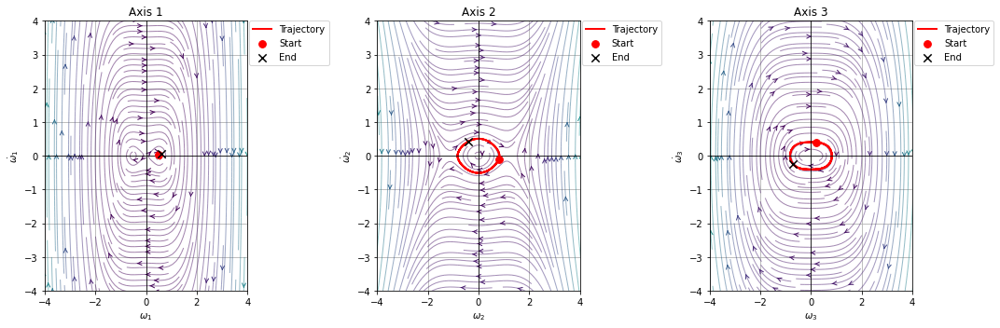

In [8]:
# ================================================ Phase Space Plotting and Numerical Checks ================================================ #
import numpy as np
# Define system parameters
I_values = [5.0, 3.0, 2.0]
omega_init = [0.5, 0.8, 0.2]
timespan = 30

# Perform numerical check
verify_duffing_ode(I_values, omega_init, t_end=timespan, dt = 0.01, check_interval=5)

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(15,5))

# Loop over each principal axis
for axis_idx, ax in enumerate(axs, start=1):
    
    # Build the Duffing for this axis
    accel_func, x0, v0, _ = undamped_duffing_ode(I_values, omega_init, axis=axis_idx)
    
    # Integrate
    sol = integrate_ode(accel_func, x0, v0, timespan, method='DOP853')

    # Plot into the chosen subplot
    # We'll label each with "Axis 1/2/3"
    phase_space_plotter(sol, accel_func, xlabel=f"$\\omega_{{{axis_idx}}}$", ylabel=f"$\\dot{{\\omega}}_{{{axis_idx}}}$", title=f"Axis {axis_idx}", ax=ax)

plt.tight_layout()
plt.show()

# 2.2) Dual Spin Spacecraft